In [35]:
# Load packages:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import geopandas as gpd
from matplotlib.lines import Line2D
import pickleshare
import folium
from datetime import datetime, timedelta
from collections import Counter
import plotly.express as px

## Table of content:

- Load datasets
- Check composition
- Check fermo
- EDA
- Drop warning 5-12-1 from wagon 710-135
- Modify "source" variable according to the 5-17
- Drop outliers found in Speed variable

## Load datasets
- raw dataset in order to check alerts during fermo
- cleaned dataset to perform EDA
- corrective and maintenance datasets to highlight when train is not in service

In [ ]:
# a) raw dataset:
df = pd.read_csv('Workset_dataset//modified_TSR_040.csv', delimiter=',')
df = df.rename(columns={'Sorgente_Dati': 'source',
                            'Vettura': 'name',
                            'Monitor': 'machine_type',
                            'Tipo': 'alert_type',
                            'Unix_timestamp(ms)': 'ts',
                            'Gruppo': 'cod',
                            'PdM': 'id',
                            'PdO': 'id1',
                            'Evento': 'event_type',
                            'Master': 'master',
                            'Pantografo': 'pantograph',
                            'Velocità': 'speed',
                            'Latitudine': 'lat',
                            'Longitudine': 'lon',
                            'extra': 'extra',
                            'Deposito': 'depot'
                            })

df['ts_UTC'] = pd.to_datetime(df['ts'], unit='ms').dt.tz_localize('UTC').dt.tz_convert('Europe/Rome')
df['Time']  = df['ts_UTC'].dt.floor('s',ambiguous=False).dt.tz_localize(None,ambiguous=False)
df = df.drop(columns=['ts_UTC'])
df['Date'] = pd.to_datetime(df['Time']).dt.date
df['Date'] = pd.to_datetime(df['Date'], format='%Y/%m/%d')
print("raw dataset:")
print(df.info())
df2 = df.sort_values(by='Date')
df3 = df2.reset_index(drop=True)
df3 = df3[df3['cod'] != 7]
df3 = df3.reset_index(drop=True)

# b) cleaned dataset of log events:
data = pd.read_parquet('Final_dataset//TSR_040_cleaned.parquet', engine='fastparquet')
data['Complete_code'] = data['Complete_code'].astype('category')
data['Criticality'] = data['Criticality'].astype('category')
data['Colour'] = data['Colour'].astype('category')
print("\n")
print("cleaned dataset:")
print(data.info())

# c) cleaned dataset of all the corrective maintenances:
corr_maint = pd.read_parquet('Final_dataset//correct_maint_040_complete.parquet', engine='fastparquet')
print("\n")
print("correct maint dataset:")
print(corr_maint.info())

# d) cleaned dataset of all the scheduled maintenances:
sched_maint = pd.read_parquet('Final_dataset//sched_maint_040.parquet', engine='fastparquet')
print("\n")
print("sched maint dataset:")
print(sched_maint.info())

In [ ]:
'''
# a) raw dataset:
df = pd.read_csv('Workset_dataset//modified_TSR_040.csv', delimiter=',')
df = df.rename(columns={'Sorgente_Dati': 'source',
                            'Vettura': 'name',
                            'Monitor': 'machine_type',
                            'Tipo': 'alert_type',
                            'Unix_timestamp(ms)': 'ts',
                            'Gruppo': 'cod',
                            'PdM': 'id',
                            'PdO': 'id1',
                            'Evento': 'event_type',
                            'Master': 'master',
                            'Pantografo': 'pantograph',
                            'Velocità': 'speed',
                            'Latitudine': 'lat',
                            'Longitudine': 'lon',
                            'extra': 'extra',
                            'Deposito': 'depot'
                            })

df['ts_UTC'] = pd.to_datetime(df['ts'], unit='ms').dt.tz_localize('UTC').dt.tz_convert('Europe/Rome')
df['Time']  = df['ts_UTC'].dt.floor('s',ambiguous=False).dt.tz_localize(None,ambiguous=False)
df = df.drop(columns=['ts_UTC'])
df['Date'] = pd.to_datetime(df['Time']).dt.date
df['Date'] = pd.to_datetime(df['Date'], format='%Y/%m/%d')
print(df.info())
df2 = df.sort_values(by='Date')
df3 = df2.reset_index(drop=True)
df3 = df3[df3['cod'] != 7]
df3 = df3.reset_index(drop=True)

# b) cleaned dataset of log events:
data = pd.read_csv('Final_dataset//TSR_040_cleaned.csv', delimiter=',', dtype={
    'Source': 'category',
    'Name': 'category',
    'Event_type': 'category',
    'Type': 'category',
    'Real_Monitor': 'category',
    'Complete_code': 'category',
    'Master': 'category',
    'Depot': 'category',
    'Criticality': 'category',
    'Colour': 'category'
})
data["Time"] = pd.to_datetime(data["Time"], format='%Y-%m-%d %H:%M:%S')
print("\n")
print(data.info())

# c) cleaned dataset of all the corrective maintenances:
corr_maint = pd.read_csv('Final_dataset//correct_maint_040_complete.csv', delimiter=',', dtype={
    'Train': 'category',
    'Wagon': 'category',
    'Type': 'category',
    'Group_maint_source': 'category',
})
corr_maint["End_date"] = pd.to_datetime(corr_maint["End_date"], format='%Y-%m-%d')
corr_maint["Start_date"] = pd.to_datetime(corr_maint["Start_date"], format='%Y-%m-%d')
corr_maint["Duration"] = corr_maint["Duration"].astype('timedelta64[s]')

# d) cleaned dataset of all the scheduled maintenances:
sched_maint = pd.read_csv('Final_dataset//sched_maint_040.csv', delimiter=',', dtype={
    'Train': 'category',
    'Type': 'category',
    'Level': 'category',
})
sched_maint["End_date"] = pd.to_datetime(sched_maint["End_date"], format='%Y-%m-%d')
sched_maint["Start_date"] = pd.to_datetime(sched_maint["Start_date"], format='%Y-%m-%d')
sched_maint["Duration"] = sched_maint["Duration"].astype('timedelta64[s]')
'''

## Check the composition of the train:

Trenord states:
- the two MCH are 711-083 and 711-084
- the two trainsets are:
    - 711-083: 710-135, 710-131
    - 711-084: 710-132, 710-170

In [4]:
# source and name:
print(f"Unique values of source: {data['Source'].unique()}")
print("\n")
print(f"Unique values of name: {data['Name'].unique()}")

Unique values of source: ['711-083', '711-084']
Categories (2, object): ['711-083', '711-084']


Unique values of name: ['711-083', '710-132', '710-170', '711-084', '710-135', '710-131']
Categories (7, object): ['710-131', '710-132', '710-135', '710-170', '711-083', '711-084', '710-000']


In [5]:
# 1) all:
contingency_table_tot = pd.crosstab(data['Source'], data['Name'], margins=True, margins_name='Total')
print("-cross check: \n", contingency_table_tot)
print("\n")


# 2) 711-083:
#   a) first filter dataset only alerts occurred on 710-135 and 710-131:
print("Check MCH 711-083:")
trainset_083 = data[(data['Name'] == '710-135') | (data['Name'] == '710-131')]
#   b) then check the corresponding MCH (it should be only 711-083):
print(f"-tot len: {len(trainset_083)}")
print(f"-which MCH? : {trainset_083['Source'].unique()}")
print(f"-how many in the wrong MCH? : {sum(trainset_083['Source'] == '711-084')}")
contingency_table_083 = pd.crosstab(trainset_083['Source'], trainset_083['Name'], margins=True, margins_name='Total')
print("-cross check: \n", contingency_table_083)
print("\n")


# 3) 711-084:
#   a) first filter dataset only alerts occurred on 710-132 and 710-170:
print("Check MCH 711-084:")
trainset_084 = data[(data['Name'] == '710-132') | (data['Name'] == '710-170')]
#   b) then check the corresponding MCH (it should be only 711-084):
print(f"-tot len: {len(trainset_084)}")
print(f"-which MCH? : {trainset_084['Source'].unique()}")
print(f"-how many in the wrong MCH? : {sum(trainset_084['Source'] == '711-083')}")
contingency_table_084 = pd.crosstab(trainset_084['Source'], trainset_084['Name'], margins=True, margins_name='Total')
print("-cross check: \n", contingency_table_084)
print("\n")


# 4) and if it is the 5-17....?:
grouped_data = data.groupby(['Type', 'Source', 'Name'])
result_grouping = grouped_data['Type'].count()
print(result_grouping)     #TRAIN_DRIVER!!!!
print("\n")
train_driver = data[data['Type'] == 'TRAIN_DRIVER']
grouped_data2 = train_driver.groupby(['Master', 'Source', 'Name'])
result_grouping2 = grouped_data2['Type'].count()
print(result_grouping2)

-cross check: 
 Name     710-131  710-132  710-135  710-170  711-083  711-084   Total
Source                                                               
711-083     7559        0    98265        0    13850        0  119674
711-084       52    23525       49    25024       63    25514   74227
Total       7611    23525    98314    25024    13913    25514  193901


Check MCH 711-083:
-tot len: 105925
-which MCH? : ['711-083', '711-084']
Categories (2, object): ['711-083', '711-084']
-how many in the wrong MCH? : 101
-cross check: 
 Name     710-131  710-135   Total
Source                           
711-083     7559    98265  105824
711-084       52       49     101
Total       7611    98314  105925


Check MCH 711-084:
-tot len: 48549
-which MCH? : ['711-084']
Categories (2, object): ['711-083', '711-084']
-how many in the wrong MCH? : 0
-cross check: 
 Name     710-132  710-170  Total
Source                          
711-084    23525    25024  48549
Total      23525    25024  48549




/tmp/ipykernel_2359701/2009623963.py:34: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_data = data.groupby(['Type', 'Source', 'Name'])
/tmp/ipykernel_2359701/2009623963.py:39: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_data2 = train_driver.groupby(['Master', 'Source', 'Name'])


## Modify "source" variable according to the 5-17

In [6]:
# modify Source variable in order to be consistent through all the dataset. Because:
#   -for alerts and warnings it identifies in which trainset the alert or warning is occurred
#   -for the train_driver, code 5-17, it identifies from which MCH the train_driver has done the action --> we change the value of source to be the same as for alerts and warnings

data['Source'] = data.apply(lambda row: '711-083' if (row['Name'] in ('710-135','710-131','711-083') and row['Complete_code'] == '5-17') else('711-084' if (row['Name'] in ('710-132','710-170','711-084') and row['Complete_code'] == '5-17') else row['Source']), axis=1)
data['Source'] = data['Source'].astype('category')

# check:
contingency_table_tot2 = pd.crosstab(data['Source'], data['Name'], margins=True, margins_name='Total')
print("-cross check: \n", contingency_table_tot2)
print("\n")

-cross check: 
 Name     710-131  710-132  710-135  710-170  711-083  711-084   Total
Source                                                               
711-083     7611        0    98314        0    13913        0  119838
711-084        0    23525        0    25024        0    25514   74063
Total       7611    23525    98314    25024    13913    25514  193901




In [7]:
'''
# 4) check the alerts in the wrong MCH:
print("Check 083 in 084:")
mch_strange = data[(data['Name'] == '711-083') & (data['Source'] == '711-084')]
print(f"-tot len: {len(mch_strange)}")
print(f"-unique dates:\n{mch_strange['Time'].unique()}")

print("\n")

print("Check wrong MCH:")
wrong_mch = trainset_083[trainset_083['Source'] == '711-084']
print(f"-unique dates:\n{wrong_mch['Time'].unique()}")


# find when the mch has changed:
time_083 = []
time_084 = []
index_wrong = wrong_mch.index
#print(index_wrong)
appoggio = index_wrong[0]

for k in range(5):
    i = appoggio
    print(f"- \nalert of wagon of 083 but in wrong MCH 084: {index_wrong[k]}")
    print(f"start of data obs iteration: {i}")
    while i <= index_wrong[k]:
        if data.loc[i, 'Source'] == '711-083':
            print(f"where back on right MCH 083: {i}")
            print(f"check right MCH: {data.loc[i, 'Source']}")
            print(f"time back on right MCH 083: {data.loc[i, 'Time']}")
            print(f"time again on wrong MCH 084: {wrong_mch.loc[index_wrong[k], 'Time']}")
            #time_084.append(wrong_mch.loc[k, 'Time'])
            #time_083.append(data.loc[i, 'Time'])
        i += 1
    appoggio = i
    
    
data[578:596]
'''

'\n# 4) check the alerts in the wrong MCH:\nprint("Check 083 in 084:")\nmch_strange = data[(data[\'Name\'] == \'711-083\') & (data[\'Source\'] == \'711-084\')]\nprint(f"-tot len: {len(mch_strange)}")\nprint(f"-unique dates:\n{mch_strange[\'Time\'].unique()}")\n\nprint("\n")\n\nprint("Check wrong MCH:")\nwrong_mch = trainset_083[trainset_083[\'Source\'] == \'711-084\']\nprint(f"-unique dates:\n{wrong_mch[\'Time\'].unique()}")\n\n\n# find when the mch has changed:\ntime_083 = []\ntime_084 = []\nindex_wrong = wrong_mch.index\n#print(index_wrong)\nappoggio = index_wrong[0]\n\nfor k in range(5):\n    i = appoggio\n    print(f"- \nalert of wagon of 083 but in wrong MCH 084: {index_wrong[k]}")\n    print(f"start of data obs iteration: {i}")\n    while i <= index_wrong[k]:\n        if data.loc[i, \'Source\'] == \'711-083\':\n            print(f"where back on right MCH 083: {i}")\n            print(f"check right MCH: {data.loc[i, \'Source\']}")\n            print(f"time back on right MCH 083: {

## Check fermo from 27/09/2023 to 25/01/2024

In [8]:
# First filter the dataset:
Fermo_treno = df3[(df3['Date'] > '2023/09/27') & (df3['Date'] < '2024/01/25')]
Fermo_treno = Fermo_treno.reset_index(drop=True)
print(f"len dataset during fermo: {len(Fermo_treno)}")
print("\n")
Fermo_treno['depot'] = Fermo_treno['depot'].astype('category')
print(f"values depot variable: {Fermo_treno['depot'].value_counts()}")
print("\n")
print(f"unique dates of alerts during fermo: {Fermo_treno['Date'].unique()}")
print("\n")


# curiosità:
alerts_after_8pm = Fermo_treno[Fermo_treno['Time'].dt.time > pd.to_datetime('20:00:00').time()]
unique_alerts_after_8pm = alerts_after_8pm['Time'].nunique()
print(f"how many alerts after 8pm: {len(alerts_after_8pm)}")
print(f"where: {alerts_after_8pm['depot'].value_counts()}")
print(f"how many unique timestamps: {unique_alerts_after_8pm}")
print("\n")


#   a)check for depot=0:
depot_0_fermo = Fermo_treno[Fermo_treno['depot'] == 0]
print(f"-len log with depot=0 during fermo: {len(depot_0_fermo)}")
print("\n")
depot_0_fermo['alert_type'] = depot_0_fermo['alert_type'].astype('category')
print(f"type of alerts with depot=0 during fermo: \n{depot_0_fermo['alert_type'].unique()}")
print("\n")
print(f"unique timestamps of alerts with depot=0 during fermo: \n{depot_0_fermo['Date'].unique()}")
print("\n")
print(f"occurrences of speed with depot=0 during fermo:\n{depot_0_fermo['speed'].value_counts()}")
print("\n")
print(f"unique lat of alerts with depot=0 during fermo: \n{depot_0_fermo['lat'].unique()}")            # varie --> c'è 0. ma è 0 o altro visto che c'è il punto?
print("\n")
print(f"unique lon of alerts with depot=0 during fermo: \n{depot_0_fermo['lon'].unique()}")            # varie --> c'è 0. ma è 0 o altro visto che c'è il punto?
print("\n")


#   b)check for depot=1:
depot_1_fermo = Fermo_treno[Fermo_treno['depot'] == 1]
print(f"-len log with depot=1 during fermo: {len(depot_1_fermo)}")
print("\n")
depot_1_fermo['alert_type'] = depot_1_fermo['alert_type'].astype('category')
print(f"type of alerts with depot=1 during fermo: \n{depot_1_fermo['alert_type'].unique()}")
print("\n")
print(f"unique timestamps of alerts with depot=1 during fermo: \n{depot_1_fermo['Date'].unique()}")
print("\n")
print(f"occurrences speed with depot=1 during fermo:\n{depot_1_fermo['speed'].value_counts()}")
print("\n")
print(f"unique lat of alerts with depot=1 during fermo: \n{depot_1_fermo['lat'].unique()}")            # varie --> c'è 0. ma è 0 o altro visto che c'è il punto?
print("\n")
print(f"unique lon of alerts with depot=1 during fermo: \n{depot_1_fermo['lon'].unique()}")            # varie --> c'è 0. ma è 0 o altro visto che c'è il punto?


#   c)plot coordinates during fermo treno:
def draw_map_with_points(df, latitude_column, longitude_column):
     """
     Disegna una mappa con punti utilizzando le coordinate di longitudine e latitudine da un DataFrame pandas.

     :param df: DataFrame pandas contenente le coordinate
     :param latitude_column: Nome della colonna nel DataFrame che contiene le latitudini
     :param longitude_column: Nome della colonna nel DataFrame che contiene le longitudini
     """
     # Prendi il centro della mappa dalle coordinate medie
     center_lat = df[latitude_column].mean()
     center_lon = df[longitude_column].mean()

     # Crea la mappa centrata
     mappa = folium.Map(location=[center_lat, center_lon], zoom_start=6)

     # Aggiungi punti alla mappa
     for _, row in df.iterrows():
         folium.Marker(location=[row[latitude_column],
row[longitude_column]]).add_to(mappa)

     return mappa

unique_gps = Fermo_treno[['lat', 'lon']].drop_duplicates()
mappa = draw_map_with_points(unique_gps, 'lat', 'lon')
mappa.save("mappaOpen_fermo_alerts.html")

len dataset during fermo: 1812


values depot variable: depot
1    1795
0      17
Name: count, dtype: int64


unique dates of alerts during fermo: <DatetimeArray>
['2024-01-11 00:00:00', '2024-01-15 00:00:00', '2024-01-19 00:00:00',
 '2024-01-20 00:00:00', '2024-01-22 00:00:00', '2024-01-23 00:00:00',
 '2024-01-24 00:00:00']
Length: 7, dtype: datetime64[ns]


how many alerts after 8pm: 437
where: depot
1    437
0      0
Name: count, dtype: int64
how many unique timestamps: 71


-len log with depot=0 during fermo: 17


type of alerts with depot=0 during fermo: 
['PDO', 'PDM', 'TrainSet']
Categories (3, object): ['PDM', 'PDO', 'TrainSet']


unique timestamps of alerts with depot=0 during fermo: 
<DatetimeArray>
['2024-01-11 00:00:00', '2024-01-15 00:00:00', '2024-01-19 00:00:00']
Length: 3, dtype: datetime64[ns]


occurrences of speed with depot=0 during fermo:
speed
0     8
13    6
9     2
11    1
Name: count, dtype: int64


unique lat of alerts with depot=0 during fermo: 
[45.5322 45.5

/tmp/ipykernel_2359701/1526232980.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  depot_0_fermo['alert_type'] = depot_0_fermo['alert_type'].astype('category')
/tmp/ipykernel_2359701/1526232980.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  depot_1_fermo['alert_type'] = depot_1_fermo['alert_type'].astype('category')


## EDA

In [9]:
# general info:
print(data.info())
print("\n")
print(f"how many observations in the cleaned dataset: {len(data)}")     # =193901
print(f"vs how many in the raw one: {len(df)}")                         # =1892948

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 193901 entries, 0 to 193900
Data columns (total 19 columns):
 #   Column         Non-Null Count   Dtype         
---  ------         --------------   -----         
 0   Source         193901 non-null  category      
 1   Name           193901 non-null  category      
 2   Time           193901 non-null  datetime64[ns]
 3   Event_type     193901 non-null  category      
 4   Type           193901 non-null  category      
 5   Real_Monitor   193901 non-null  category      
 6   cod            193901 non-null  int64         
 7   id             193901 non-null  int64         
 8   id1            193901 non-null  int64         
 9   Complete_code  193901 non-null  category      
 10  Master         193901 non-null  category      
 11  Speed          193901 non-null  int64         
 12  Depot          193901 non-null  category      
 13  Lat            193901 non-null  float64       
 14  Lon            193901 non-null  float64       
 15  

count                           193901
mean     2021-12-13 10:46:35.033501184
min                2020-11-12 06:54:18
25%                2021-08-14 09:19:56
50%                2021-09-09 10:53:24
75%                2022-03-30 14:06:40
max                2023-09-27 22:25:50
Name: Time, dtype: object


starting: 2020-11-12 06:54:18
ending: 2023-09-27 22:25:50
MTTE (Mean Time To Event): 0 days 00:07:47.712697266
n. of unique timestamps: 134052


how many alerts between 08/2021 and 10/2021?: 93711


where: 
Name
710-135    86193
711-084     2377
710-132     2224
711-083     1259
710-170     1200
710-131      458
710-000        0
Name: count, dtype: int64


-most frequent alerts: 
[('5-12-1', 85657), ('5-5-1', 781), ('5-9-1', 614), ('5-1-1', 511), ('5-98-17', 493)]


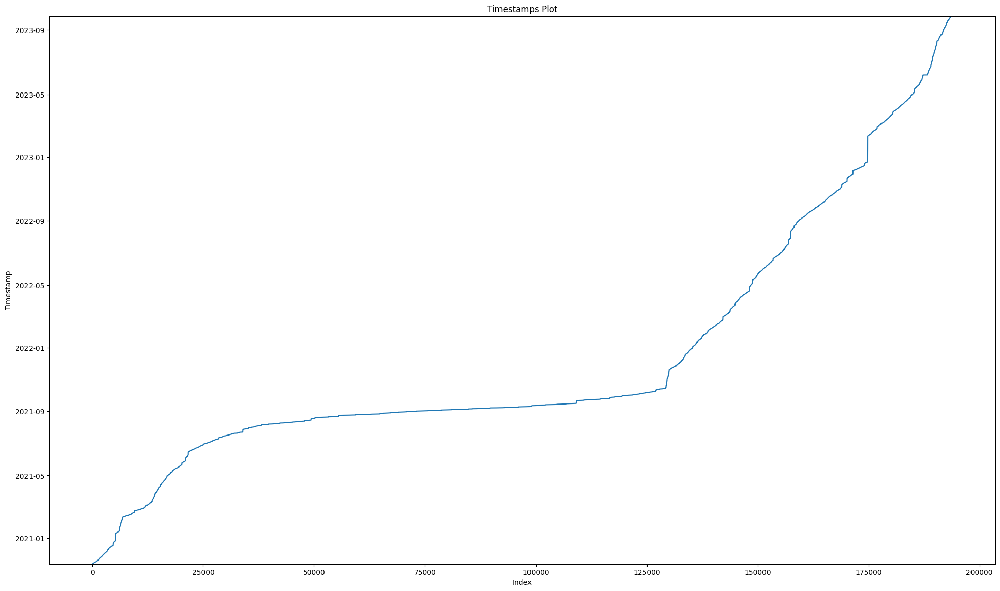

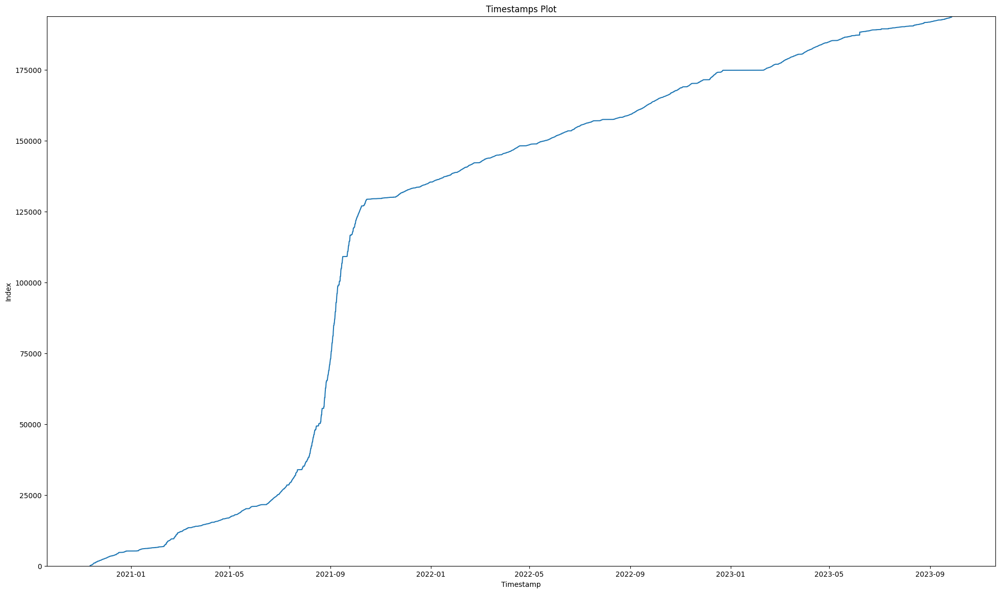

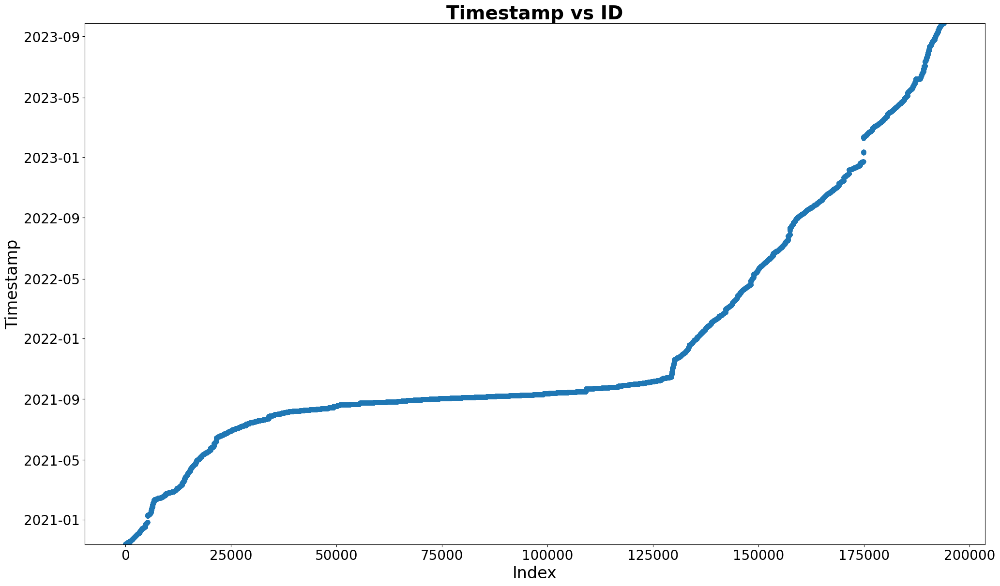

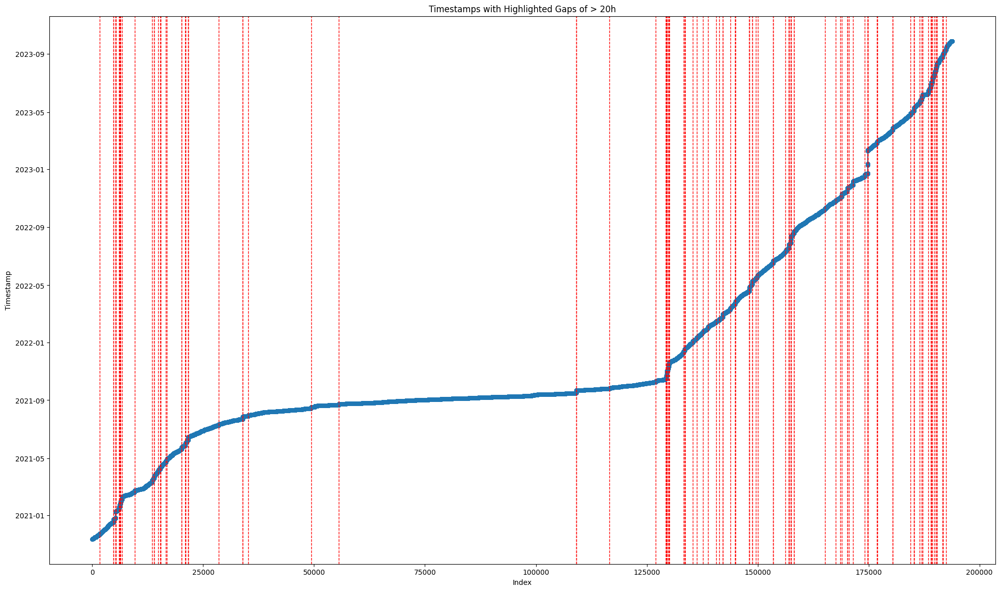

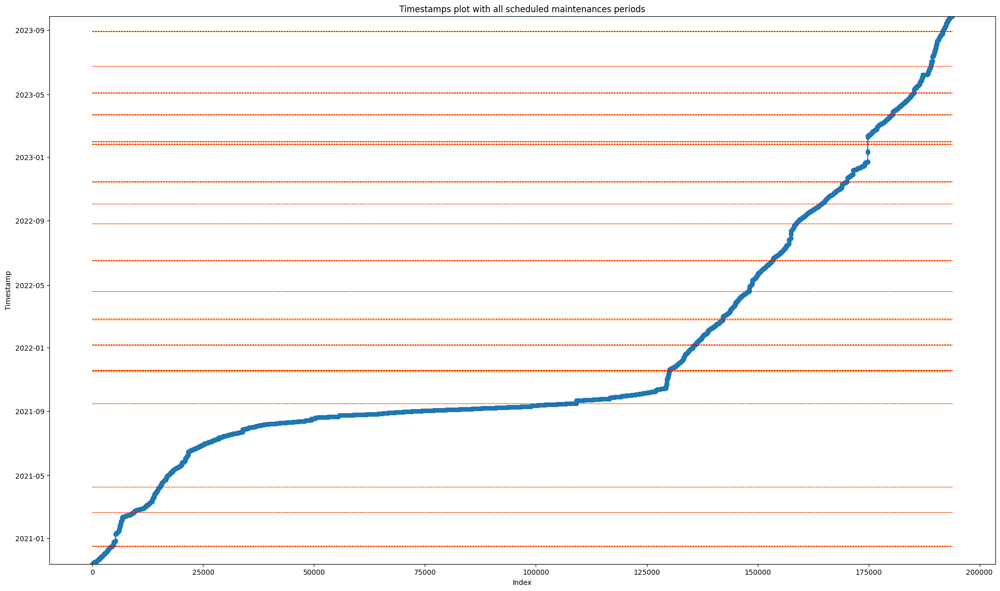

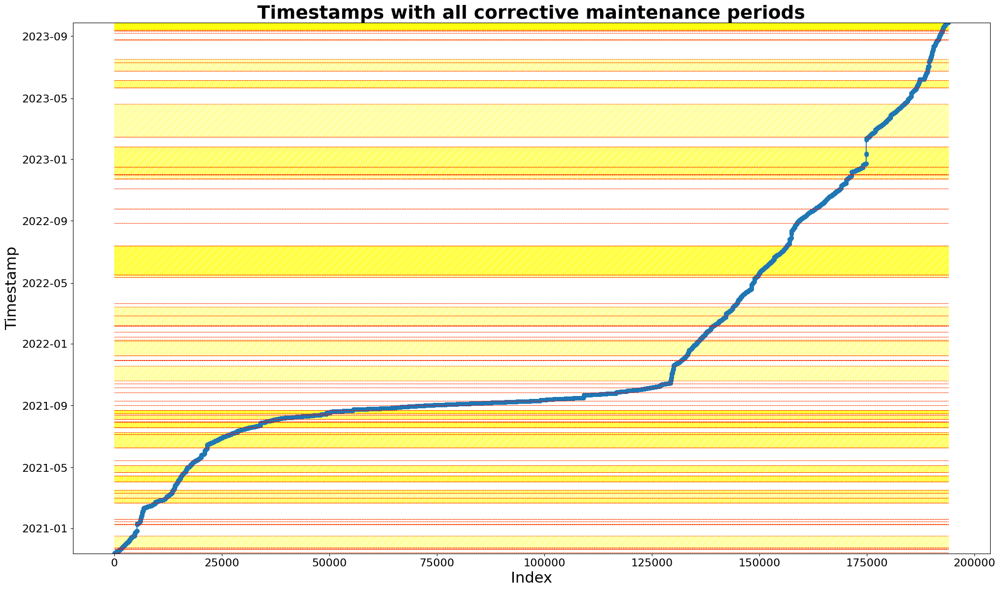

In [10]:
# Time variable:
print(data['Time'].describe())
print("\n")
print(f"starting: {data['Time'].min()}")                        # 2020-11-12 06:54:18
print(f"ending: {data['Time'].max()}")                          # 2023-09-27 22:25:50
time_diff_between_obs = data['Time'].diff()
print(f"MTTE (Mean Time To Event): {time_diff_between_obs.mean()}")     # 0 days 00:07:47.712697266 --> 8 minuti
print(f"n. of unique timestamps: {data['Time'].nunique()}")             # =134052

# plot:
#   a) line:
plt.figure(figsize=(24, 14))
plt.plot(data.index, data['Time'])
plt.ylim(data['Time'].min(), data['Time'].max())
plt.xlabel('Index')
plt.ylabel('Timestamp')
plt.title('Timestamps Plot')
# x e y invertiti:
plt.figure(figsize=(24, 14))
plt.plot(data['Time'], data.index)
plt.ylim(data.index.min(), data.index.max())
plt.xlabel('Timestamp')
plt.ylabel('Index')
plt.title('Timestamps Plot')


#   b) points to highlight gaps:
plt.figure(figsize=(24, 14))
plt.ylim(data['Time'].min(), data['Time'].max())
plt.scatter(data.index, data['Time'], marker='o')
plt.xlabel('Index', fontsize=24)
plt.ylabel('Timestamp', fontsize=24)
plt.title('Timestamp vs ID', fontsize=28, fontweight='bold')
plt.yticks(fontsize=20)
plt.xticks(fontsize=20)
plt.savefig('timestamp_id_plot.png', transparent=True)


#   c) highlight significant gaps:
threshold = pd.Timedelta(hours=20)  # Define a threshold for significant gaps
gaps = time_diff_between_obs[time_diff_between_obs > threshold]
plt.figure(figsize=(24, 14))
plt.plot(data.index, data['Time'], marker='o', linestyle='-', markersize=5)
for gap_index in gaps.index:
    plt.axvline(x=gap_index, color='r', linestyle='--', linewidth=1)        #vertical line at each significant gap index to highlight where these gaps occur
plt.xlabel('Index')
plt.ylabel('Timestamp')
plt.title('Timestamps with Highlighted Gaps of > 20h')


#   d) highlights scheduled maintenances (all types):
plt.figure(figsize=(24, 14))
plt.plot(data.index, data['Time'], marker='o', linestyle='-', markersize=5)
plt.ylim(data['Time'].min(), data['Time'].max())
plt.xlabel('Index')
plt.ylabel('Timestamp')
plt.title('Timestamps plot with all scheduled maintenances periods')

for start, end in zip(sched_maint["Start_date"], sched_maint["End_date"]):
    if not pd.isna(start):
        plt.hlines(y=[start, end], xmin=0, xmax=len(data), color='r', ls='--', linewidth=0.7)
        plt.fill_betweenx([start, end], 0, len(data), color='yellow', alpha=0.5)


#   e) highlights corrective maintenances (all types):
plt.figure(figsize=(24, 14))
plt.plot(data.index, data['Time'], marker='o', linestyle='-', markersize=5)
plt.ylim(data['Time'].min(), data['Time'].max())
plt.xlabel('Index', fontsize=22)
plt.ylabel('Timestamp', fontsize=22)
plt.title('Timestamps with all corrective maintenance periods', fontsize=27, fontweight='bold')
plt.yticks(fontsize=16)
plt.xticks(fontsize=16)

for start, end in zip(corr_maint["Start_date"], corr_maint["End_date"]):
    if not pd.isna(start):
        plt.hlines(y=[start, end], xmin=0, xmax=len(data), color='r', ls='--', linewidth=0.5)
        plt.fill_betweenx([start, end], 0, len(data), color='yellow', alpha=0.3, hatch='//')


# deeper check on months 08,09,10 OF 2021 since the slope is almost 0 --> why so many alerts?
check_no_slope = data[(data['Time'] >= '2021/08/01') & (data['Time'] <= '2021/10/31')]
print("\n")
print(f"how many alerts between 08/2021 and 10/2021?: {len(check_no_slope)}")   # =93711
print("\n")
print(f"where: \n{check_no_slope['Name'].value_counts()}")
print("\n")
count_codes = Counter(check_no_slope['Complete_code'])
print(f"-most frequent alerts: \n{count_codes.most_common(5)}")

count      193901
unique          2
top       711-083
freq       119838
Name: Source, dtype: object


nan values: 0


Source
711-083    119838
711-084     74063
Name: count, dtype: int64


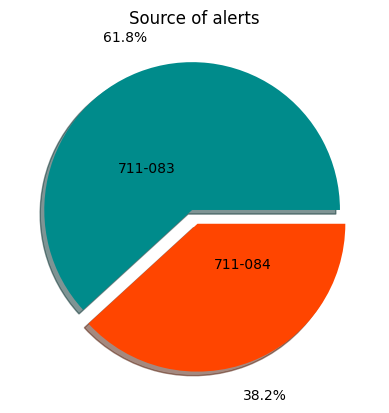

In [11]:
# "Source" variable:
print(data['Source'].describe())
print("\n")
print(f"nan values: {data['Source'].isna().sum()}")
print("\n")
print(data['Source'].value_counts())

sizes_source = data['Source'].value_counts().tolist()
labels_source = data['Source'].value_counts().index

fig, ax = plt.subplots()
ax.pie(sizes_source, labels=labels_source, explode=[0.05]*len(labels_source == "711-084"), autopct='%1.1f%%', pctdistance=1.25, labeldistance=.3, shadow=True, colors=['darkcyan', 'orangered'])
plt.title('Source of alerts')
plt.show()

count      193901
unique          6
top       710-135
freq        98314
Name: Name, dtype: object


nan values: 0


Name
710-135    98314
711-084    25514
710-170    25024
710-132    23525
711-083    13913
710-131     7611
710-000        0
Name: count, dtype: int64


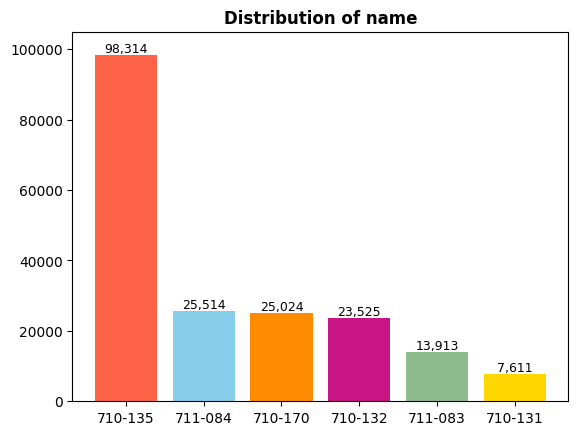

-most frequent alerts at wagon 710-135: 
[('5-12-1', 91264), ('5-5-1', 1455), ('5-98-17', 1000), ('5-9-1', 729), ('5-3-1', 464)]


In [12]:
# "Name" variable:
print(data['Name'].describe())
print("\n")
print(f"nan values: {data['Name'].isna().sum()}")
print("\n")
print(data['Name'].value_counts())

sizes_name = data['Name'].value_counts().tolist()
sizes_name = sizes_name[:-1]
labels_name = data['Name'].value_counts().index
labels_name = labels_name[:-1]

fig, ax = plt.subplots()
bar_container = ax.bar(labels_name, sizes_name, color=['tomato', 'skyblue', 'darkorange', 'mediumvioletred', 'darkseagreen', 'gold'])
ax.bar_label(bar_container, fmt='{:,.0f}', fontsize=9)
ax.set_title('Distribution of name', fontweight='bold')
ax.set_ylim(0, 105000)
plt.savefig('name_plot.png', transparent=True)
plt.show()

# deeper on wagon 135:
data_135 = data[data['Name'] == '710-135']
count_codes_135 = Counter(data_135['Complete_code'])
print(f"-most frequent alerts at wagon 710-135: \n{count_codes_135.most_common(5)}")    # problematic alert is 5-12-1

In [13]:
# Event_type variable:
print(data['Event_type'].describe())
print("\n")
print(data['Event_type'].value_counts())

count     193901
unique         1
top           ON
freq      193901
Name: Event_type, dtype: object


Event_type
ON     193901
OFF         0
Name: count, dtype: int64


count     193901
unique         3
top          PDO
freq      100659
Name: Type, dtype: object


nan values: 0


Type
PDO             100659
WARNING          92821
TRAIN_DRIVER       421
Name: count, dtype: int64


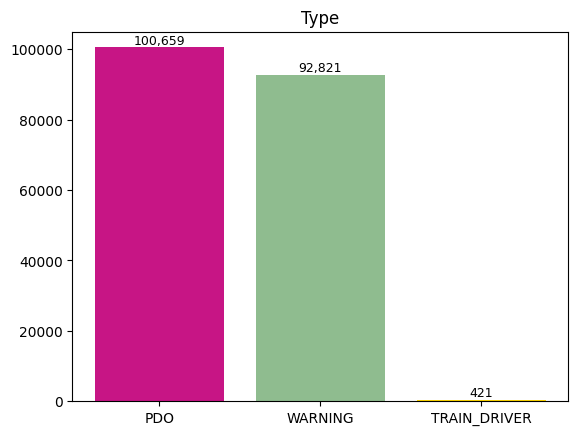

In [14]:
# Type variable:
print(data['Type'].describe())
print("\n")
print(f"nan values: {data['Type'].isna().sum()}")
print("\n")
print(data['Type'].value_counts())

sizes_type = data['Type'].value_counts().tolist()
labels_type = data['Type'].value_counts().index

fig, ax = plt.subplots()
bar_container = ax.bar(labels_type, sizes_type, color=['mediumvioletred', 'darkseagreen', 'gold'])
ax.bar_label(bar_container, fmt='{:,.0f}', fontsize=9)
ax.set(title='Type', ylim=(0, 105000))
plt.show()

In [15]:
# Real_monitor variable:
print(data['Real_Monitor'].describe())
print("\n")
print(data['Real_Monitor'].value_counts())

count     193901
unique         1
top           MD
freq      193901
Name: Real_Monitor, dtype: object


Real_Monitor
MD    193901
MS         0
Name: count, dtype: int64


In [16]:
# "cod", "id", "id1":
print(f"n. of unique cod: {data['cod'].nunique()}")     # 2
print("\n")
print(f"n. of unique id: {data['id'].nunique()}")       # 14
print("\n")
print(f"n. of unique id1: {data['id1'].nunique()}")     # 33
print("\n")

# "complete_code" variable:
print(f"n. of unique complete_code: {data['Complete_code'].nunique()}")     # 220
print("\n")
print(data['Complete_code'].describe())
print("\n")
print(f"nan values: {data['Complete_code'].isna().sum()}")
print("\n")
print(data['Complete_code'].value_counts())
print("\n")

# check alerts group 2:
filtered_df = data[(data["cod"] == 2)]
print(f"how many alerts group 2: {len(filtered_df)}")
sum_by_fullcode = filtered_df.groupby("Complete_code", dropna=False).size()
print("\n")
print(sum_by_fullcode[:2])

n. of unique cod: 2


n. of unique id: 23


n. of unique id1: 34


n. of unique complete_code: 220


count     193901
unique       220
top       5-12-1
freq       91454
Name: Complete_code, dtype: object


nan values: 0


Complete_code
5-12-1     91454
5-5-1       9618
5-98-10     6724
5-98-17     6056
5-9-1       5168
           ...  
5-36-3        19
5-36-16       14
5-90-4        13
5-90-3        12
5-90-7         6
Name: count, Length: 220, dtype: int64


how many alerts group 2: 1390


Complete_code
2-19-1    714
2-19-2    676
dtype: int64


/tmp/ipykernel_2359701/2903717782.py:22: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  sum_by_fullcode = filtered_df.groupby("Complete_code", dropna=False).size()


count             193901
unique                 3
top       Master Assente
freq              103722
Name: Master, dtype: object


nan values: 0


Master
Master Assente    103722
711-083            57744
711-084            32435
Name: count, dtype: int64




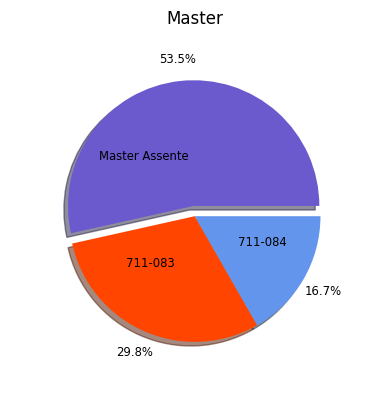

In [17]:
# Master variable:
print(data['Master'].describe())
print("\n")
print(f"nan values: {data['Master'].isna().sum()}")
print("\n")
print(data['Master'].value_counts())
print("\n")

sizes_master = data['Master'].value_counts().tolist()
labels_master = data['Master'].value_counts().index

fig, ax = plt.subplots()
ax.pie(sizes_master, labels=labels_master, explode=[0.07]*(labels_master == "Master Assente"), autopct='%1.1f%%', pctdistance=1.18, labeldistance=.4, shadow=True, colors=['slateblue', 'orangered', 'cornflowerblue'], radius=0.85, textprops={'size': 'smaller'})
plt.title('Master')
plt.show()

count    193901.000000
mean         42.740548
std          32.210989
min           0.000000
25%           6.000000
50%          44.000000
75%          66.000000
max         127.000000
Name: Speed, dtype: float64


nan values: 0


n. of unique speed: 128


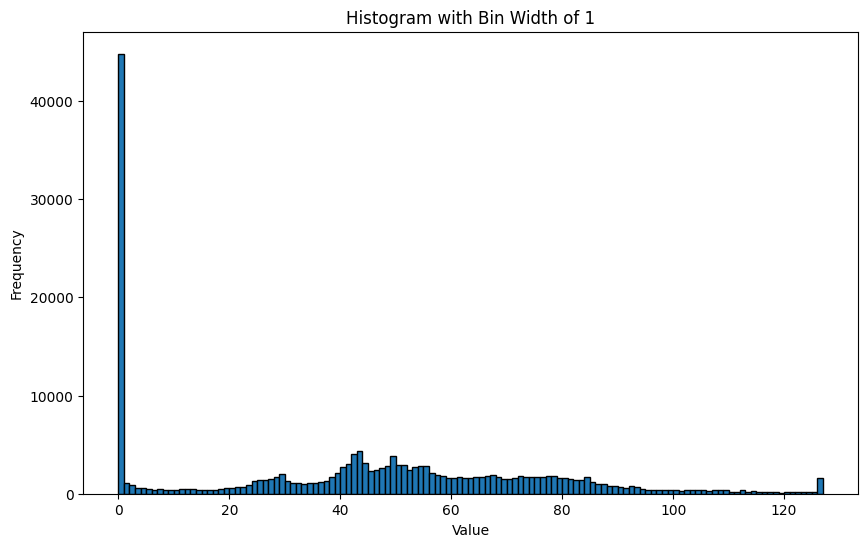

In [18]:
# Speed variable:
print(data['Speed'].describe())
print("\n")
print(f"nan values: {data['Speed'].isna().sum()}")
print("\n")
print(f"n. of unique speed: {data['Speed'].nunique()}")

bin_width = 1
bins = np.arange(min(data['Speed']), max(data['Speed']) + bin_width, bin_width)
plt.figure(figsize=(10, 6))
plt.hist(data['Speed'], bins=bins, edgecolor='black')
plt.xlabel('Value')
plt.ylabel('Frequency')
plt.title(f'Histogram with Bin Width of {bin_width}')
plt.show()

Empty DataFrame
Columns: [Source, Name, Time, Event_type, Type, Real_Monitor, cod, id, id1, Complete_code, Master, Speed, Depot, Lat, Lon, Lat_umt, Lon_umt, Criticality, Colour]
Index: []


how many alert at speed=0: 44807
which alert at speed=0: 
Complete_code
5-98-10    5697
5-9-1      2691
5-12-1     1642
5-9-99     1583
5-1-1      1363
5-5-1      1154
5-98-7     1152
5-9-6       802
5-98-9      780
5-98-26     673
Name: count, dtype: int64


how many alert at speed=127: 1329
which alert at speed=127: 
Complete_code
5-12-1     676
5-7-1       51
5-7-2       51
5-5-1       30
5-35-10     19
5-35-12     16
5-98-7      16
5-35-9      16
5-35-13     15
5-98-30     15
Name: count, dtype: int64


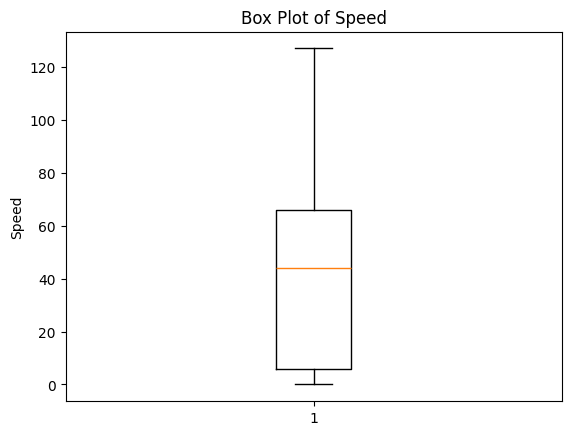

In [19]:
# check outliers:
Q1 = data['Speed'].quantile(0.25)
Q3 = data['Speed'].quantile(0.75)
IQR = Q3 - Q1
threshold = IQR * 1.5
outliers_speed = data[(data['Speed'] < Q1 - threshold) | (data['Speed'] > Q3 + threshold)]
print(outliers_speed)

# deeper on alerts at speed=0km/h:
speed_0 = data[data['Speed'] == 0 ]
print("\n")
print(f"how many alert at speed=0: {len(speed_0)}")
print(f"which alert at speed=0: \n{(speed_0['Complete_code'].value_counts())[:10]}")
print("\n")

# deeper on alerts at speed=127km/h:
speed_127 = data[data['Speed'] == 127 ]
print(f"how many alert at speed=127: {len(speed_127)}")
print(f"which alert at speed=127: \n{(speed_127['Complete_code'].value_counts())[:10]}")

# plot check for outlier
plt.boxplot(data['Speed'])
plt.ylabel('Speed')
plt.title('Box Plot of Speed')
plt.show()

fig = px.histogram(data, x="Speed", marginal="box", title="Speed variable histogram+boxplot")
fig.show()

In [20]:
# Depot variable:
print(data['Depot'].describe())
print("\n")
print(data['Depot'].value_counts())
print("\n")

count     193901
unique         1
top            0
freq      193901
Name: Depot, dtype: object


Depot
0    193901
1         0
Name: count, dtype: int64




In [21]:
# Lat variable:
print(data['Lat'].describe())
print("\n")
print(f"nan values: {(data['Lat'] == 0).sum()}")
print("\n")
print(f"n. of unique lat: {data['Lat'].nunique()}")
print(f"first 10 unique values lat: {sorted(data['Lat'].unique()[:10])}")

count    193901.000000
mean         44.935819
std           5.104120
min           0.000000
25%          45.452800
50%          45.501000
75%          45.599700
max          45.908400
Name: Lat, dtype: float64


nan values: 2463


n. of unique lat: 3347
first 10 unique values lat: [0.0, 45.4342, 45.4344, 45.4395, 45.4545, 45.5203, 45.522, 45.5578, 45.5633, 45.5789]


In [22]:
# Lon variable:
print(data['Lon'].describe())
print("\n")
print(f"nan values: {(data['Lon'] == 0).sum()}")
print("\n")
print(f"n. of unique lon: {data['Lon'].nunique()}")
print(f"first 10 unique values lon: {sorted(data['Lon'].unique()[:10])}")

count    193901.000000
mean          8.997443
std           1.032082
min           0.000000
25%           9.089190
50%           9.159170
75%           9.175010
max           9.498610
Name: Lon, dtype: float64


nan values: 2455


n. of unique lon: 9247
first 10 unique values lon: [0.0, 9.15667, 9.15668, 9.16196, 9.16639, 9.16669, 9.16778, 9.23639, 9.23667, 9.23808]


Focus province: 
      COD_RIP  COD_REG  COD_PROV  COD_CM  COD_UTS               DEN_PROV  \
11         1        3        12       0       12                 Varese   
12         1        3        13       0       13                   Como   
14         1        3        15     215      215                      -   
17         1        3        18       0       18                  Pavia   
97         1        3        98       0       98                   Lodi   
103        1        3       108       0      108  Monza e della Brianza   

     DEN_CM                DEN_UTS SIGLA             TIPO_UTS     Shape_Leng  \
11        -                 Varese    VA            Provincia  277190.348031   
12        -                   Como    CO            Provincia  296571.232935   
14   Milano                 Milano    MI  Città metropolitana  380926.516349   
17        -                  Pavia    PV            Provincia  526409.610793   
97        -                   Lodi    LO            Prov

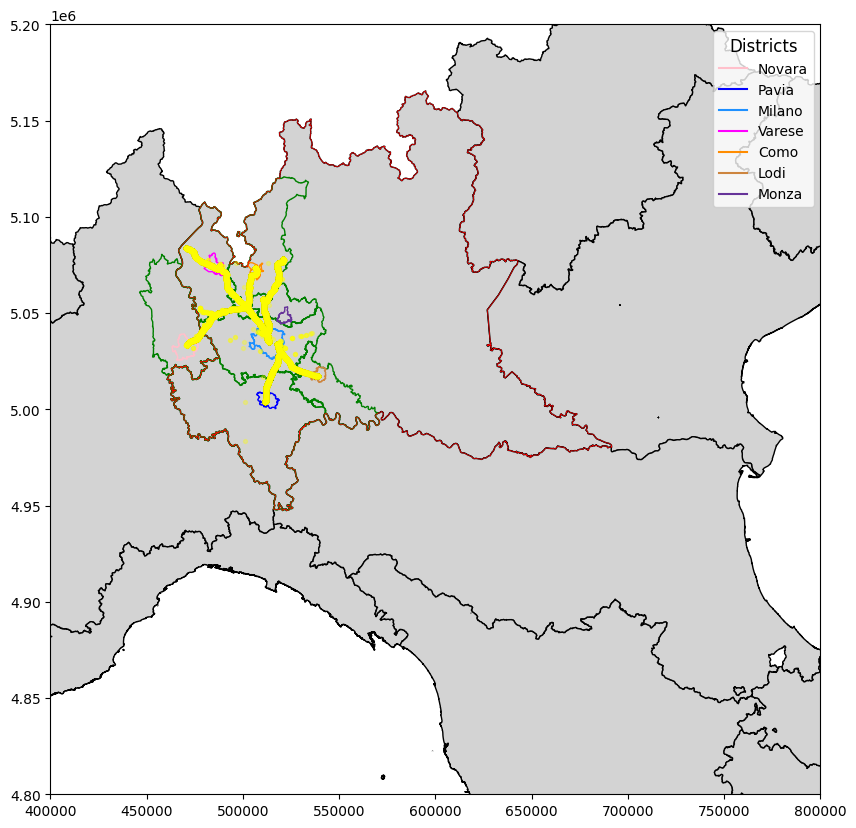

In [23]:
# Geographical coordinates plot:
%run -i 'plot_gps_coordinates.py'

count     193901
unique         2
top            0
freq      185605
Name: Criticality, dtype: int64


nan values: 0


Criticality
0    185605
1      8296
Name: count, dtype: int64




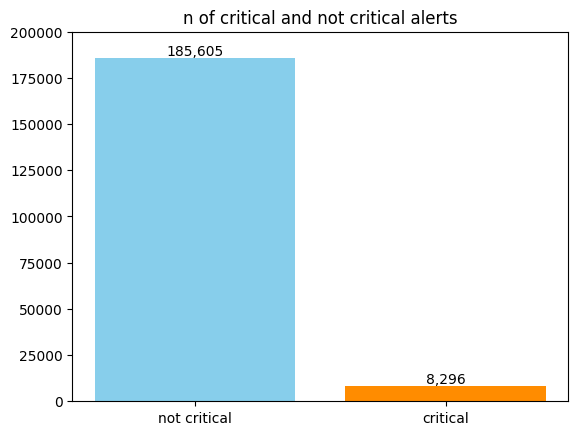

In [24]:
# Criticality variable:
print(data['Criticality'].describe())
print("\n")
print(f"nan values: {data['Criticality'].isna().sum()}")
print("\n")
print(data['Criticality'].value_counts())
print("\n")

criticality_counts = data['Criticality'].value_counts()
criticality_mapping = {
    0: "not critical",
    1: "critical"
}
labels_criticality = criticality_counts.index.map(criticality_mapping)
sizes_criticality = data['Criticality'].value_counts().tolist()

fig, ax = plt.subplots()
bar_container = ax.bar(labels_criticality, sizes_criticality, color=['skyblue', 'darkorange'])
ax.bar_label(bar_container, fmt='{:,.0f}', fontsize=10)
ax.set(title='n of critical and not critical alerts', ylim=(0,200000))
plt.show()

count      193901
unique          2
top       azzurro
freq       162721
Name: Colour, dtype: object


nan values: 0


Colour
azzurro    162721
giallo      31180
Name: count, dtype: int64




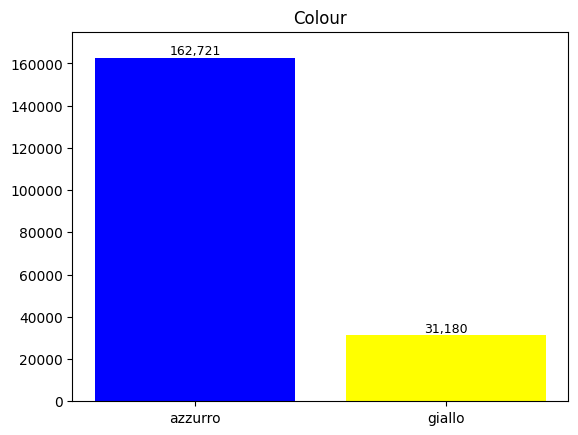

In [25]:
# Colour variable:
print(data['Colour'].describe())
print("\n")
print(f"nan values: {data['Colour'].isna().sum()}")
print("\n")
print(data['Colour'].value_counts())
print("\n")

sizes_colour = data['Colour'].value_counts().tolist()
labels_colour = data['Colour'].value_counts().index

fig, ax = plt.subplots()
bar_container = ax.bar(labels_colour, sizes_colour, color=['blue', 'yellow'])
ax.bar_label(bar_container, fmt='{:,.0f}', fontsize=9)
ax.set(title='Colour', ylim=(0, 175000))
plt.show()

## Check warning 5-12-1 and drop

In [26]:
# 1) general check:
print(f"-how many alerts in the entire dataset?: {len(data)}")
print(f"-how many alerts occurred at wagon 710-135?: {len(data_135)}")
print(f"-most frequent alerts at wagon 710-135: \n{count_codes_135.most_common(5)}")
print(f"-how many 5-12-1 in the entire dataset: {(data['Complete_code'] == '5-12-1').sum()}")
print(f"-how many 5-12-1 in wagon 710-135: {(data_135['Complete_code'] == '5-12-1').sum()}")
print(f"-ratio of alert at wagon 710-135 over the entire dataset: {((data_135['Complete_code'] == '5-12-1').sum()) / ((data['Complete_code'] == '5-12-1').sum())}")
print("\n")
print(f"-how many 5-3-6 in the entire dataset: {(data['Complete_code'] == '5-3-6').sum()}")
print(f"-how many 5-3-6 in wagon 710-135: {(data_135['Complete_code'] == '5-3-6').sum()}")

-how many alerts in the entire dataset?: 193901
-how many alerts occurred at wagon 710-135?: 98314
-most frequent alerts at wagon 710-135: 
[('5-12-1', 91264), ('5-5-1', 1455), ('5-98-17', 1000), ('5-9-1', 729), ('5-3-1', 464)]
-how many 5-12-1 in the entire dataset: 91454
-how many 5-12-1 in wagon 710-135: 91264
-ratio of alert at wagon 710-135 over the entire dataset: 0.99792245281781


-how many 5-3-6 in the entire dataset: 54
-how many 5-3-6 in wagon 710-135: 0


In [27]:
'''
# 2) drop warning 5-12-1 from the entire dataset:
no_5_12_1 = data[data['Complete_code'] != '5-12-1']
no_5_12_1 = no_5_12_1.reset_index(drop=True)
print(f"-len dataset without 5-12-1: {len(no_5_12_1)}")
#print((no_5_12_1['Complete_code'] == '5-12-1').sum())

print("\n")
Q1_no_5_12_1 = no_5_12_1['Speed'].quantile(0.25)
Q3_no_5_12_1 = no_5_12_1['Speed'].quantile(0.75)
IQR_no_5_12_1 = Q3_no_5_12_1 - Q1_no_5_12_1
threshold_no_5_12_1 = IQR_no_5_12_1 * 1.5
outliers_speed_no_5_12_1 = no_5_12_1[(no_5_12_1['Speed'] < Q1_no_5_12_1 - threshold_no_5_12_1) | (no_5_12_1['Speed'] > Q3_no_5_12_1 + threshold_no_5_12_1)]
print(f"outliers of speed: {len(outliers_speed_no_5_12_1)}")
print(f"outlier values of speed: \n{outliers_speed_no_5_12_1['Speed'].describe()}")

plt.figure(figsize=(12, 7))
plt.ylim(no_5_12_1['Time'].min(), no_5_12_1['Time'].max())
plt.scatter(no_5_12_1.index, no_5_12_1['Time'], marker='o')
plt.xlabel('Index')
plt.ylabel('Timestamp')
plt.title('Gaps in Timestamps')

sizes_source = no_5_12_1['Source'].value_counts().tolist()
labels_source = no_5_12_1['Source'].value_counts().index
fig, ax = plt.subplots()
ax.pie(sizes_source, labels=labels_source, explode=[0.05]*len(labels_source == "711-084"), autopct='%1.1f%%', pctdistance=1.25, labeldistance=.3, shadow=True, colors=['darkcyan', 'orangered'])
plt.title('Source of alerts')

sizes_name = no_5_12_1['Name'].value_counts().tolist()
labels_name = no_5_12_1['Name'].value_counts().index
fig, ax = plt.subplots()
bar_container = ax.bar(labels_name, sizes_name, color=['tomato', 'skyblue', 'darkorange', 'mediumvioletred', 'darkseagreen', 'gold'])
ax.bar_label(bar_container, fmt='{:,.0f}', fontsize=9)
ax.set(title='Wagon alerts', ylim=(0, 105000))
plt.show()

bin_width = 1
bins = np.arange(min(no_5_12_1['Speed']), max(no_5_12_1['Speed']) + bin_width, bin_width)
plt.figure(figsize=(10, 6))
plt.hist(no_5_12_1['Speed'], bins=bins, edgecolor='black')
plt.xlabel('Value')
plt.ylabel('Frequency')
plt.title(f'Histogram with Bin Width of {bin_width}')
plt.show()

plt.boxplot(no_5_12_1['Speed'])
plt.ylabel('Speed')
plt.title('Box Plot of Speed')
plt.show()

fig, ax = plt.subplots(figsize=(10, 10))
Regioni.plot(ax=ax, color='lightgray', edgecolor='black')                   				# Italy with regions boundaries
Province_lombardia_to_plot.plot(ax=ax, color='none', edgecolor='green')     				# highlighting provinces
Comuni_lombardia_to_plot.plot(ax=ax, color='none', edgecolor=['blue', 'dodgerblue', 'magenta', 'darkorange', 'peru', 'rebeccapurple'])      # highlights districts
Province_piemonte_to_plot.plot(ax=ax, color='none', edgecolor='green')
Comuni_piemonte_to_plot.plot(ax=ax, color='none', edgecolor='pink')
Lombardia.plot(ax=ax, color='none', edgecolor='red', linewidth=0.5)							# highlighting Lombardia
plt.scatter(no_5_12_1.Lat_umt, no_5_12_1.Lon_umt, color='yellow', marker='o', s=8, alpha=0.3)   				# alerts' coordinates
ax.set_xlim(0.4e6, 0.8e6)
ax.set_ylim(4.8e6, 5.2e6)
custom_lines = [Line2D([0], [0], color='pink', linestyle='-'),
				Line2D([0], [0], color='blue', linestyle='-'),
				Line2D([0], [0], color='dodgerblue', linestyle='-'),
				Line2D([0], [0], color='magenta', linestyle='-'),
				Line2D([0], [0], color='darkorange', linestyle='-'),
				Line2D([0], [0], color='peru', linestyle='-'),
				Line2D([0], [0], color='rebeccapurple', linestyle='-'),
				]
plt.legend(custom_lines, ['Novara', 'Pavia', 'Milano', 'Varese', 'Como', 'Lodi', 'Monza'], facecolor='white', title='Districts',
		   fontsize='medium', title_fontsize='large');
'''

'\n# 2) drop warning 5-12-1 from the entire dataset:\nno_5_12_1 = data[data[\'Complete_code\'] != \'5-12-1\']\nno_5_12_1 = no_5_12_1.reset_index(drop=True)\nprint(f"-len dataset without 5-12-1: {len(no_5_12_1)}")\n#print((no_5_12_1[\'Complete_code\'] == \'5-12-1\').sum())\n\nprint("\n")\nQ1_no_5_12_1 = no_5_12_1[\'Speed\'].quantile(0.25)\nQ3_no_5_12_1 = no_5_12_1[\'Speed\'].quantile(0.75)\nIQR_no_5_12_1 = Q3_no_5_12_1 - Q1_no_5_12_1\nthreshold_no_5_12_1 = IQR_no_5_12_1 * 1.5\noutliers_speed_no_5_12_1 = no_5_12_1[(no_5_12_1[\'Speed\'] < Q1_no_5_12_1 - threshold_no_5_12_1) | (no_5_12_1[\'Speed\'] > Q3_no_5_12_1 + threshold_no_5_12_1)]\nprint(f"outliers of speed: {len(outliers_speed_no_5_12_1)}")\nprint(f"outlier values of speed: \n{outliers_speed_no_5_12_1[\'Speed\'].describe()}")\n\nplt.figure(figsize=(12, 7))\nplt.ylim(no_5_12_1[\'Time\'].min(), no_5_12_1[\'Time\'].max())\nplt.scatter(no_5_12_1.index, no_5_12_1[\'Time\'], marker=\'o\')\nplt.xlabel(\'Index\')\nplt.ylabel(\'Timestamp\')\

In [28]:
# 3) drop warning 5-12-1 only from wagon 135:
data2 = data[~((data['Name'] == '710-135') & (data['Complete_code'] == '5-12-1'))]
data2 = data2.reset_index(drop=True)
print(f"len dataset before dropping 5-12-1 from 710-135: {len(data)}")
print(f"len dataset after dropping 5-12-1 from 710-135: {len(data2)}")    # =193.901-91.264 top!
data_135_2 = data2[data2['Name'] == '710-135']
count_codes_135_2 = Counter(data_135_2['Complete_code'])
print(f"-most frequent alerts at wagon 710-135: \n{count_codes_135_2.most_common(5)}")    # top!


# check:
print("\n")
print(f"-how many 5-12-1 in the entire dataset: {(data2['Complete_code'] == '5-12-1').sum()}")
print(f"-how many 5-12-1 in wagon 710-135: {(data_135_2['Complete_code'] == '5-12-1').sum()}")
print(f"-ratio of alert at wagon135/totaldataset: {((data_135_2['Complete_code'] == '5-12-1').sum()) / ((data2['Complete_code'] == '5-12-1').sum())}")
print(f"-how many 5-3-6 in the entire dataset: {(data2['Complete_code'] == '5-3-6').sum()}")
print(f"-how many 5-3-6 in wagon 710-135: {(data_135_2['Complete_code'] == '5-3-6').sum()}")


# check other variables:
#   a) speed outliers:
#   1) IQR:
print("\n")
Q1_no_5_12_1_2 = data2['Speed'].quantile(0.25)
Q3_no_5_12_1_2 = data2['Speed'].quantile(0.75)
IQR_no_5_12_1_2 = Q3_no_5_12_1_2 - Q1_no_5_12_1_2
threshold_no_5_12_1_2 = IQR_no_5_12_1_2 * 1.5
outliers_speed_no_5_12_1_2 = data2[(data2['Speed'] < Q1_no_5_12_1_2 - threshold_no_5_12_1_2) | (data2['Speed'] > Q3_no_5_12_1_2 + threshold_no_5_12_1_2)]
print(f"how many outliers according to IQR method and lamdba=1.5: {len(outliers_speed_no_5_12_1_2)}")
print(f"outlier values in speed: \n{outliers_speed_no_5_12_1_2['Speed'].describe()}")
print(f"ratio outlier/lentotdataset: {len(outliers_speed_no_5_12_1_2) / len(data2)}")    # 0.00905131677660103

#   2) standard scores:
#!pip install scipy
from scipy import stats
speed_z_score = np.abs(stats.zscore(data2['Speed']))
outlier_speed_indices3 = np.where(speed_z_score > 3)[0]
outlier_speed_indices4 = np.where(speed_z_score > 4)[0]
print("\n")
print(f"how many outliers according to standard score method with threshold=3: {len(outlier_speed_indices3)}")
print(f"how many outliers according to standard score method with threshold=4: {len(outlier_speed_indices4)}")

#   deeper on alerts at speed=0km/h:
speed_0_2 = data2[data2['Speed'] == 0 ]
print("\n")
print(f"how many alerts at speed=0: {len(speed_0_2)}")
print(f"which alerts at speed=0: \n{(speed_0_2['Complete_code'].value_counts())[:10]}")
print("\n")
#   deeper on alerts at speed>125km/h:
speed_125 = data2[data2['Speed'] > 125 ]
print(f"how many alerts at speed>125: {len(speed_125)}")
print(f"which alerts at speed>125: \n{(speed_125['Complete_code'].value_counts())[:10]}")

'''
#   b) time:
plt.figure(figsize=(12, 7))
plt.ylim(data2['Time'].min(), data2['Time'].max())
plt.scatter(data2.index, data2['Time'], marker='o')
plt.xlabel('Index')
plt.ylabel('Timestamp')
plt.title('Gaps in Timestamps')

#   c) source:
sizes_source = data2['Source'].value_counts().tolist()
labels_source = data2['Source'].value_counts().index
fig, ax = plt.subplots()
ax.pie(sizes_source, labels=labels_source, explode=[0.05]*len(labels_source == "711-084"), autopct='%1.1f%%', pctdistance=1.25, labeldistance=.3, shadow=True, colors=['darkcyan', 'orangered'])
plt.title('Source of alerts')

#   d) name:
sizes_name = data2['Name'].value_counts().tolist()
sizes_name = sizes_name[:-1]
labels_name = data2['Name'].value_counts().index
labels_name = labels_name[:-1]
fig, ax = plt.subplots()
bar_container = ax.bar(labels_name, sizes_name, color=['tomato', 'skyblue', 'darkorange', 'mediumvioletred', 'darkseagreen', 'gold'])
ax.bar_label(bar_container, fmt='{:,.0f}', fontsize=9)
ax.set(title='Wagon alerts', ylim=(0, 105000))
plt.show()

#   e) speed:
bin_width = 1
bins = np.arange(min(data2['Speed']), max(data2['Speed']) + bin_width, bin_width)
plt.figure(figsize=(10, 6))
plt.hist(data2['Speed'], bins=bins, edgecolor='black')
plt.xlabel('Value')
plt.ylabel('Frequency')
plt.title(f'Histogram with Bin Width of {bin_width}')
plt.show()

plt.boxplot(data2['Speed'])
plt.ylabel('Speed')
plt.title('Box Plot of Speed')
plt.show()

fig = px.histogram(data2, x="Speed", marginal="box", title="Speed variable histogram+boxplot")
fig.show()

#   f) gps coordinates:
fig, ax = plt.subplots(figsize=(10, 10))
Regioni.plot(ax=ax, color='lightgray', edgecolor='black')                   				# Italy with regions boundaries
Province_lombardia_to_plot.plot(ax=ax, color='none', edgecolor='green')     				# highlighting provinces
Comuni_lombardia_to_plot.plot(ax=ax, color='none', edgecolor=['blue', 'dodgerblue', 'magenta', 'darkorange', 'peru', 'rebeccapurple'])      # highlights districts
Province_piemonte_to_plot.plot(ax=ax, color='none', edgecolor='green')
Comuni_piemonte_to_plot.plot(ax=ax, color='none', edgecolor='pink')
Lombardia.plot(ax=ax, color='none', edgecolor='red', linewidth=0.5)							# highlighting Lombardia
plt.scatter(data2.Lat_umt, data2.Lon_umt, color='yellow', marker='o', s=8, alpha=0.3)   				# alerts' coordinates
ax.set_xlim(0.4e6, 0.8e6)
ax.set_ylim(4.8e6, 5.2e6)
custom_lines = [Line2D([0], [0], color='pink', linestyle='-'),
				Line2D([0], [0], color='blue', linestyle='-'),
				Line2D([0], [0], color='dodgerblue', linestyle='-'),
				Line2D([0], [0], color='magenta', linestyle='-'),
				Line2D([0], [0], color='darkorange', linestyle='-'),
				Line2D([0], [0], color='peru', linestyle='-'),
				Line2D([0], [0], color='rebeccapurple', linestyle='-'),
				]
plt.legend(custom_lines, ['Novara', 'Pavia', 'Milano', 'Varese', 'Como', 'Lodi', 'Monza'], facecolor='white', title='Districts',
		   fontsize='medium', title_fontsize='large');
'''

len dataset before dropping 5-12-1 from 710-135: 193901
len dataset after dropping 5-12-1 from 710-135: 102637
-most frequent alerts at wagon 710-135: 
[('5-5-1', 1455), ('5-98-17', 1000), ('5-9-1', 729), ('5-3-1', 464), ('5-98-30', 431)]


-how many 5-12-1 in the entire dataset: 190
-how many 5-12-1 in wagon 710-135: 0
-ratio of alert at wagon135/totaldataset: 0.0
-how many 5-3-6 in the entire dataset: 54
-how many 5-3-6 in wagon 710-135: 0


how many outliers according to IQR method and lamdba=1.5: 929
outlier values in speed: 
count    929.000000
mean     126.276642
std        1.303139
min      123.000000
25%      126.000000
50%      127.000000
75%      127.000000
max      127.000000
Name: Speed, dtype: float64
ratio outlier/lentotdataset: 0.00905131677660103


how many outliers according to standard score method with threshold=3: 746
how many outliers according to standard score method with threshold=4: 0


how many alerts at speed=0: 43335
which alerts at speed=0: 
Complete_code
5

'\n#   b) time:\nplt.figure(figsize=(12, 7))\nplt.ylim(data2[\'Time\'].min(), data2[\'Time\'].max())\nplt.scatter(data2.index, data2[\'Time\'], marker=\'o\')\nplt.xlabel(\'Index\')\nplt.ylabel(\'Timestamp\')\nplt.title(\'Gaps in Timestamps\')\n\n#   c) source:\nsizes_source = data2[\'Source\'].value_counts().tolist()\nlabels_source = data2[\'Source\'].value_counts().index\nfig, ax = plt.subplots()\nax.pie(sizes_source, labels=labels_source, explode=[0.05]*len(labels_source == "711-084"), autopct=\'%1.1f%%\', pctdistance=1.25, labeldistance=.3, shadow=True, colors=[\'darkcyan\', \'orangered\'])\nplt.title(\'Source of alerts\')\n\n#   d) name:\nsizes_name = data2[\'Name\'].value_counts().tolist()\nsizes_name = sizes_name[:-1]\nlabels_name = data2[\'Name\'].value_counts().index\nlabels_name = labels_name[:-1]\nfig, ax = plt.subplots()\nbar_container = ax.bar(labels_name, sizes_name, color=[\'tomato\', \'skyblue\', \'darkorange\', \'mediumvioletred\', \'darkseagreen\', \'gold\'])\nax.bar_l

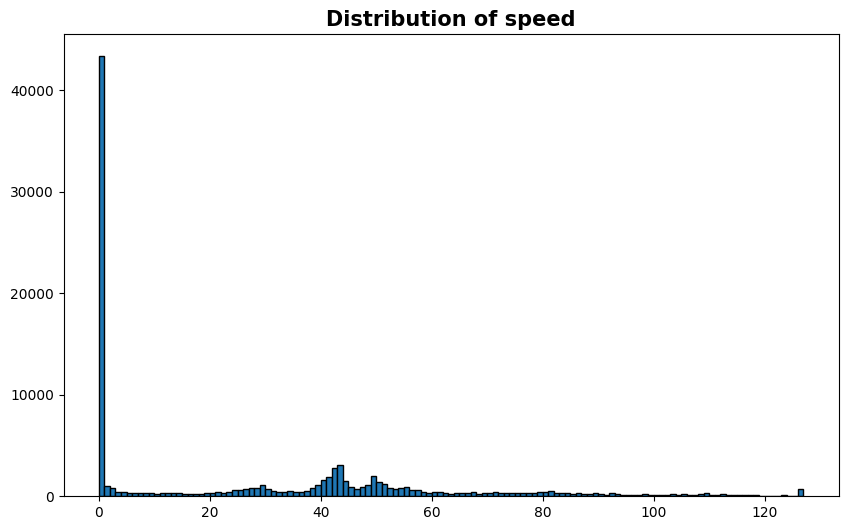

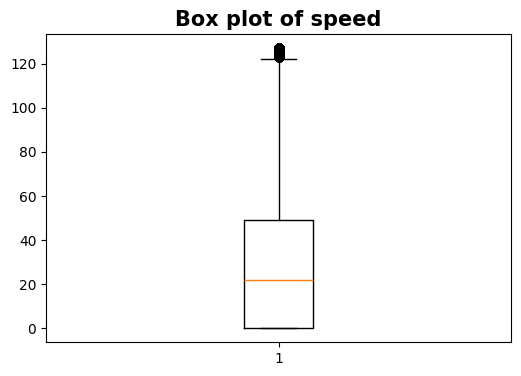

In [29]:
#   e) speed:
#   e) speed:
bin_width = 1
bins = np.arange(min(data2['Speed']), max(data2['Speed']) + bin_width, bin_width)
plt.figure(figsize=(10, 6))
plt.hist(data2['Speed'], bins=bins, edgecolor='black')
plt.title('Distribution of speed', fontweight='bold', fontsize=15)
plt.savefig('speed_hist.png', transparent=True)
plt.show()

plt.figure(figsize=(6, 4))
plt.boxplot(data2['Speed'])
plt.title('Box plot of speed', fontweight='bold', fontsize=15)
plt.savefig('speed_boxplot.png', transparent=True)
plt.show()

## Drop outliers

In [30]:
# drop obs flagged as outliers according to the IQR method:
outliers_index = outliers_speed_no_5_12_1_2.index
data3 = data2.drop(outliers_index)
data3 = data3.reset_index(drop=True)
print(len(data2),len(outliers_index),len(data3))
print("\n")
data3.info()

102637 929 101708


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 101708 entries, 0 to 101707
Data columns (total 19 columns):
 #   Column         Non-Null Count   Dtype         
---  ------         --------------   -----         
 0   Source         101708 non-null  category      
 1   Name           101708 non-null  category      
 2   Time           101708 non-null  datetime64[ns]
 3   Event_type     101708 non-null  category      
 4   Type           101708 non-null  category      
 5   Real_Monitor   101708 non-null  category      
 6   cod            101708 non-null  int64         
 7   id             101708 non-null  int64         
 8   id1            101708 non-null  int64         
 9   Complete_code  101708 non-null  category      
 10  Master         101708 non-null  category      
 11  Speed          101708 non-null  int64         
 12  Depot          101708 non-null  category      
 13  Lat            101708 non-null  float64       
 14  Lon            101708 non-null  

starting: 2020-11-12 06:54:18
ending: 2023-09-27 22:25:50
MTTE (Mean Time To Event): 0 days 00:14:51.674044067
n. of unique timestamps: 46228


n. of unique complete_code: 220
skewness score for speed variable: 0.858914768840524
kurtosis score for speed variable: -0.15440821121668336


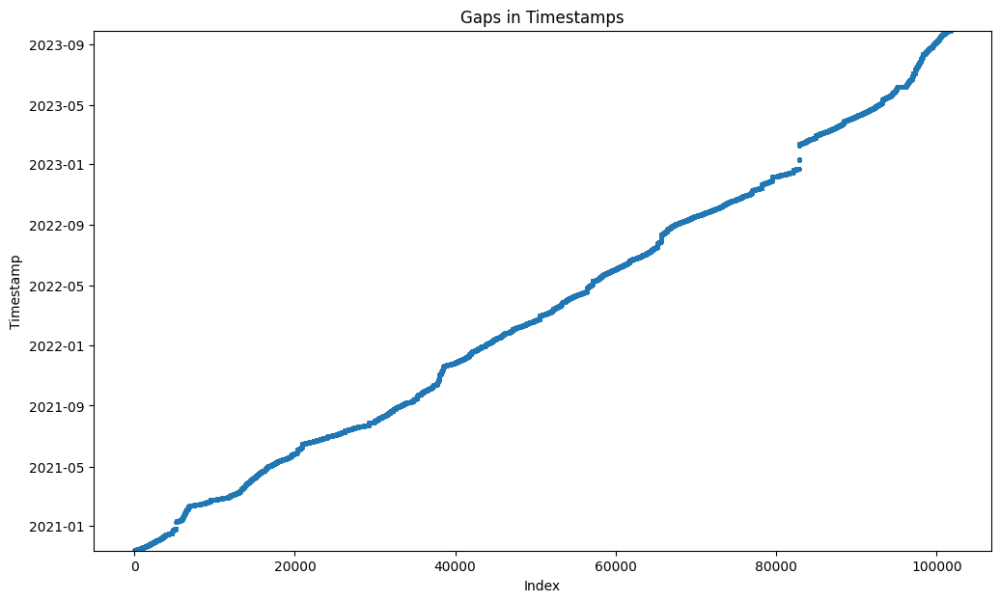

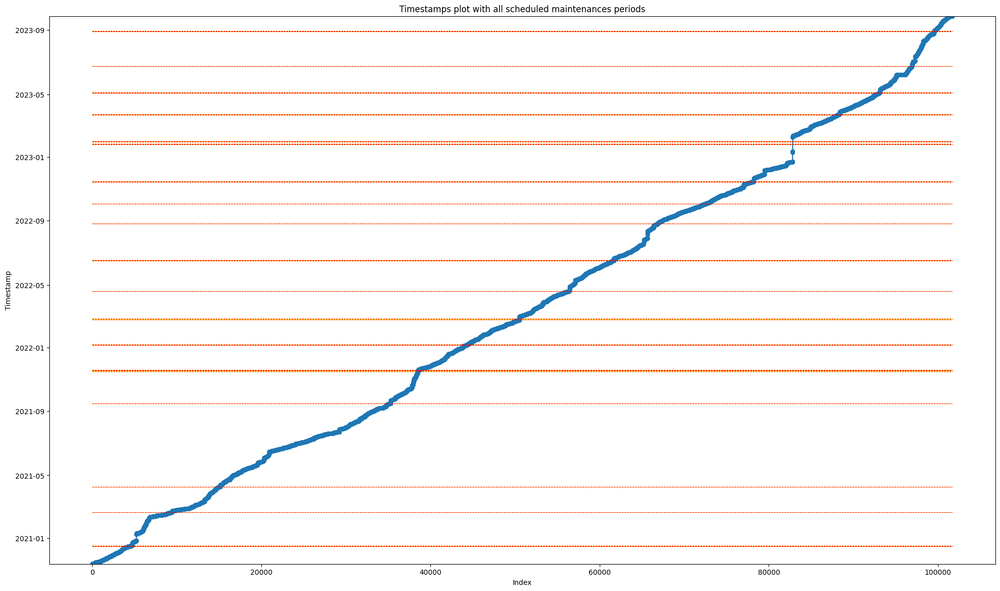

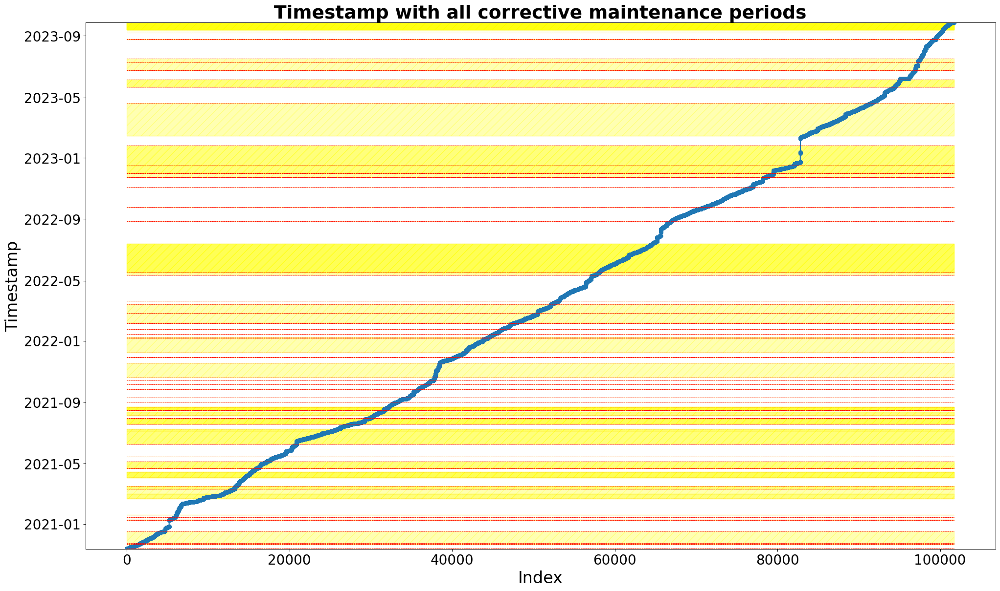

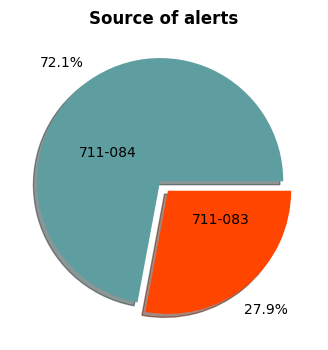

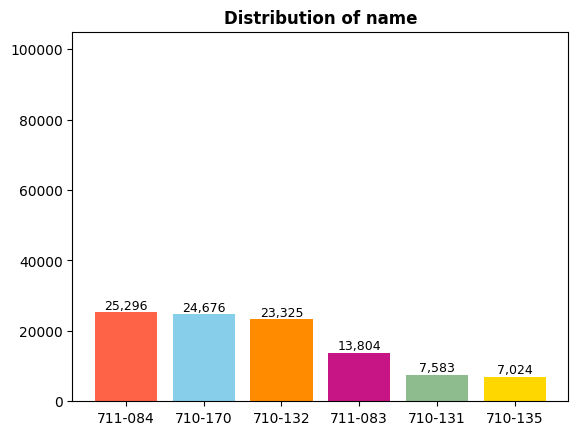

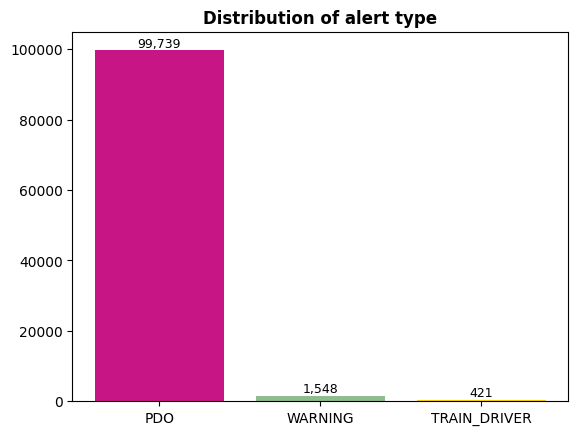

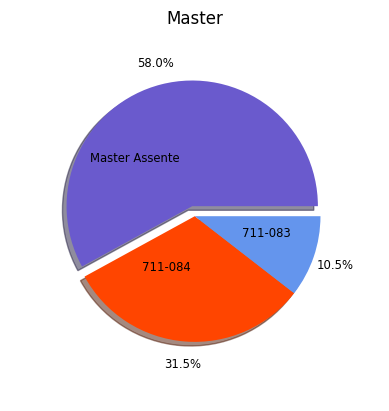

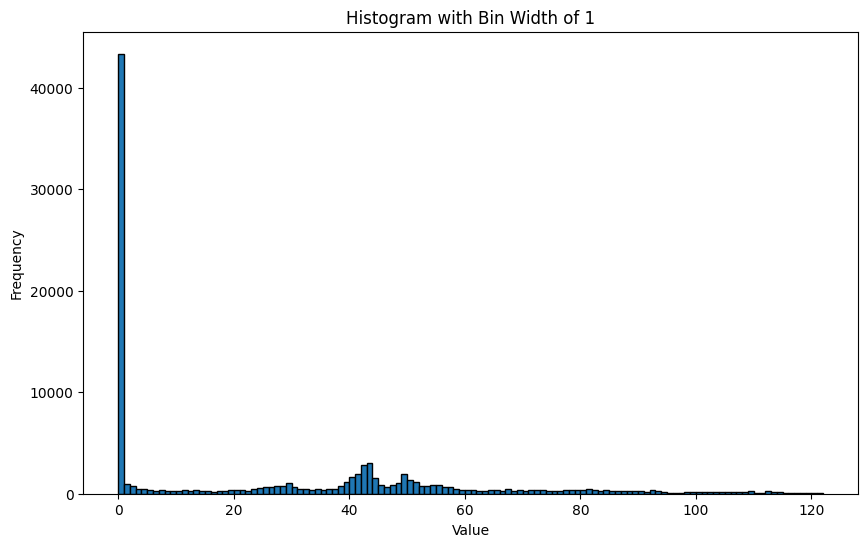

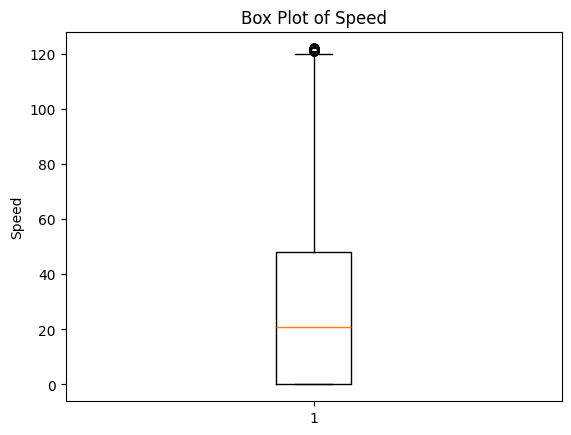

In [31]:
# quick check of all the variables:

print(f"starting: {data3['Time'].min()}")                        # 2020-11-12 06:54:18
print(f"ending: {data3['Time'].max()}")                          # 2023-09-27 22:25:50
time_diff_between_obs = data3['Time'].diff()
print(f"MTTE (Mean Time To Event): {time_diff_between_obs.mean()}")     # 0 days 00:07:47.712697266 --> 8 minuti
print(f"n. of unique timestamps: {data3['Time'].nunique()}")             # =134052
print("\n")
print(f"n. of unique complete_code: {data3['Complete_code'].nunique()}")    # still all 220 codes
from scipy.stats import skew
print(f"skewness score for speed variable: {skew(data3['Speed'])}")
from scipy.stats import kurtosis
print(f"kurtosis score for speed variable: {kurtosis(data3['Speed'])}")     # 3.0 is subtracted from the result to give 0.0 for a normal distribution

#   a) time:
plt.figure(figsize=(12, 7))
plt.ylim(data3['Time'].min(), data3['Time'].max())
plt.scatter(data3.index, data3['Time'], marker='o', s=5)
plt.xlabel('Index')
plt.ylabel('Timestamp')
plt.title('Gaps in Timestamps')

#   highlights scheduled maintenances (all types):
plt.figure(figsize=(24, 14))
plt.plot(data3.index, data3['Time'], marker='o', linestyle='-', markersize=5)
plt.ylim(data3['Time'].min(), data3['Time'].max())
plt.xlabel('Index')
plt.ylabel('Timestamp')
plt.title('Timestamps plot with all scheduled maintenances periods')

for start, end in zip(sched_maint["Start_date"], sched_maint["End_date"]):
    if not pd.isna(start):
        plt.hlines(y=[start, end], xmin=0, xmax=len(data3), color='r', ls='--', linewidth=0.7)
        plt.fill_betweenx([start, end], 0, len(data3), color='yellow', alpha=0.5)

#   highlights corrective maintenances (all types):
plt.figure(figsize=(24, 14))
plt.plot(data3.index, data3['Time'], marker='o', linestyle='-', markersize=5)
plt.ylim(data3['Time'].min(), data3['Time'].max())
plt.xlabel('Index', fontsize=24)
plt.ylabel('Timestamp', fontsize=24)
plt.title('Timestamp with all corrective maintenance periods', fontsize=27, fontweight='bold')
plt.yticks(fontsize=20)
plt.xticks(fontsize=20)

for start, end in zip(corr_maint["Start_date"], corr_maint["End_date"]):
    if not pd.isna(start):
        plt.hlines(y=[start, end], xmin=0, xmax=len(data3), color='r', ls='--', linewidth=0.5)
        plt.fill_betweenx([start, end], 0, len(data3), color='yellow', alpha=0.3, hatch='//')

plt.savefig('timestamp_corr_maint_plot.png', transparent=True)

#   b) source:
sizes_source = data3['Source'].value_counts().tolist()
labels_source = data3['Source'].value_counts().index
fig, ax = plt.subplots(figsize=(4, 4))
ax.pie(sizes_source, labels=labels_source, explode=[0.05]*len(labels_source == "711-084"), autopct='%1.1f%%', pctdistance=1.25, labeldistance=.3, shadow=True, colors=['cadetblue', 'orangered'])
plt.title('Source of alerts', fontweight='bold')
plt.savefig('source.png', transparent=True)

#   c) name:
sizes_name = data3['Name'].value_counts().tolist()
sizes_name = sizes_name[:-1]
labels_name = data3['Name'].value_counts().index
labels_name = labels_name[:-1]
fig, ax = plt.subplots()
bar_container = ax.bar(labels_name, sizes_name, color=['tomato', 'skyblue', 'darkorange', 'mediumvioletred', 'darkseagreen', 'gold'])
ax.bar_label(bar_container, fmt='{:,.0f}', fontsize=9)
ax.set_title('Distribution of name', fontweight='bold')
ax.set_ylim(0, 105000)
plt.savefig('name.png', transparent=True)
plt.show()

#   d) type:
sizes_type = data3['Type'].value_counts().tolist()
labels_type = data3['Type'].value_counts().index
fig, ax = plt.subplots()
bar_container = ax.bar(labels_type, sizes_type, color=['mediumvioletred', 'darkseagreen', 'gold'])
ax.bar_label(bar_container, fmt='{:,.0f}', fontsize=9)
ax.set_title('Distribution of alert type', fontweight='bold')
ax.set_ylim(0, 105000)
plt.savefig('alert_type.png', transparent=True)
plt.show()

#   f) master:
sizes_master = data3['Master'].value_counts().tolist()
labels_master = data3['Master'].value_counts().index
fig, ax = plt.subplots()
ax.pie(sizes_master, labels=labels_master, explode=[0.07]*(labels_master == "Master Assente"), autopct='%1.1f%%', pctdistance=1.18, labeldistance=.4, shadow=True, colors=['slateblue', 'orangered', 'cornflowerblue'], radius=0.85, textprops={'size': 'smaller'})
plt.title('Master')
plt.show()

#   g) speed:
bin_width = 1
bins = np.arange(min(data3['Speed']), max(data3['Speed']) + bin_width, bin_width)
plt.figure(figsize=(10, 6))
plt.hist(data3['Speed'], bins=bins, edgecolor='black')
plt.xlabel('Value')
plt.ylabel('Frequency')
plt.title(f'Histogram with Bin Width of {bin_width}')
plt.show()

plt.boxplot(data3['Speed'])
plt.ylabel('Speed')
plt.title('Box Plot of Speed')
plt.show()

fig = px.histogram(data3, x="Speed", marginal="box", title="Speed variable histogram+boxplot")
fig.show()

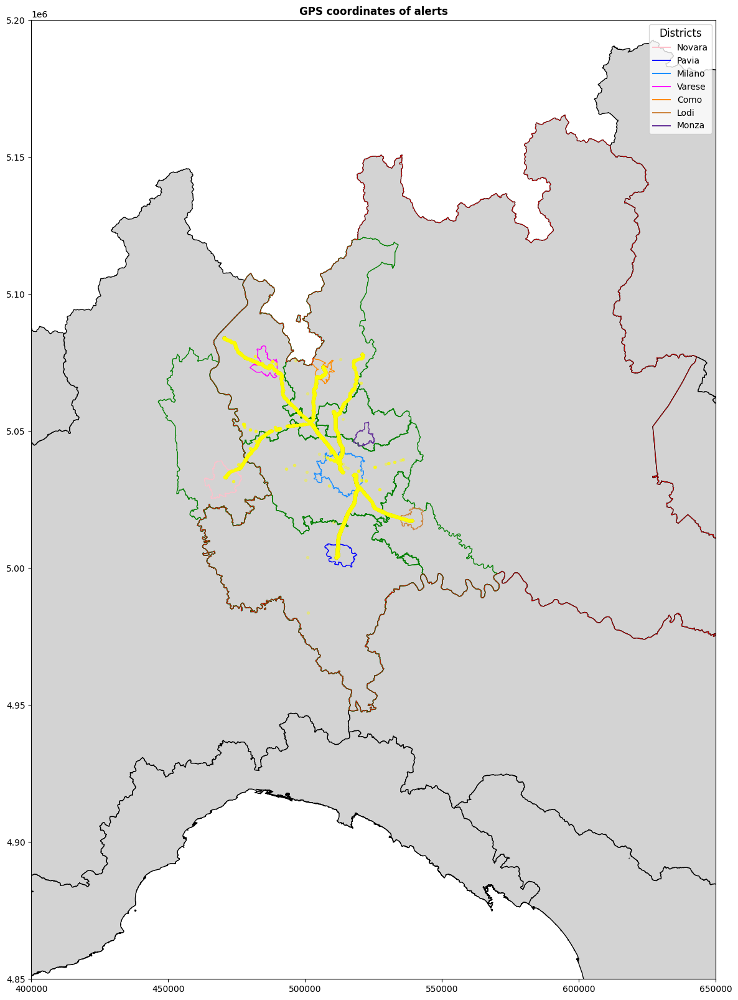

In [32]:

#   h) gps coordinates:
fig, ax = plt.subplots(figsize=(10, 10))
Regioni.plot(ax=ax, color='lightgray', edgecolor='black')                   				# Italy with regions boundaries
Province_lombardia_to_plot.plot(ax=ax, color='none', edgecolor='green')     				# highlighting provinces
Comuni_lombardia_to_plot.plot(ax=ax, color='none', edgecolor=['blue', 'dodgerblue', 'magenta', 'darkorange', 'peru', 'rebeccapurple'])      # highlights districts
Province_piemonte_to_plot.plot(ax=ax, color='none', edgecolor='green')
Comuni_piemonte_to_plot.plot(ax=ax, color='none', edgecolor='pink')
Lombardia.plot(ax=ax, color='none', edgecolor='red', linewidth=0.5)							# highlighting Lombardia
plt.scatter(data3.Lat_umt, data3.Lon_umt, color='yellow', marker='o', s=8, alpha=0.3)   				# alerts' coordinates
ax.set_xlim(0.4e6, 0.65e6)
ax.set_ylim(4.85e6, 5.2e6)
ax.set_title('GPS coordinates of alerts', fontweight='bold')
custom_lines = [Line2D([0], [0], color='pink', linestyle='-'),
				Line2D([0], [0], color='blue', linestyle='-'),
				Line2D([0], [0], color='dodgerblue', linestyle='-'),
				Line2D([0], [0], color='magenta', linestyle='-'),
				Line2D([0], [0], color='darkorange', linestyle='-'),
				Line2D([0], [0], color='peru', linestyle='-'),
				Line2D([0], [0], color='rebeccapurple', linestyle='-'),
				]
plt.legend(custom_lines, ['Novara', 'Pavia', 'Milano', 'Varese', 'Como', 'Lodi', 'Monza'], facecolor='white', title='Districts',
		   fontsize='medium', title_fontsize='large');
plt.savefig('gps.png', transparent=True)

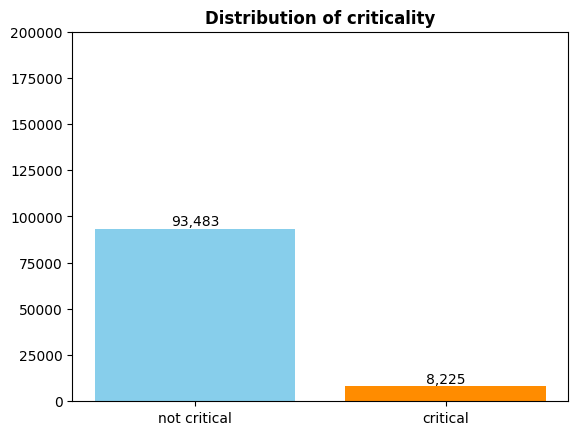

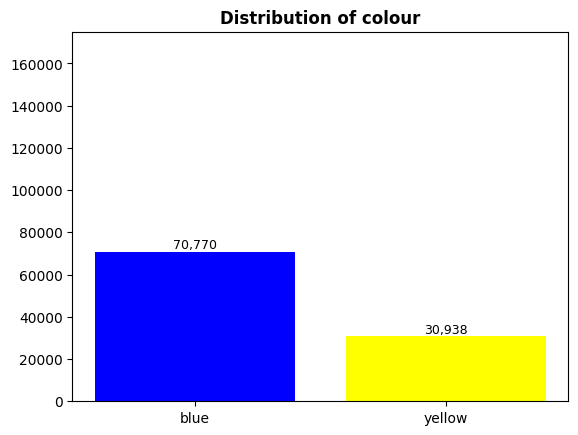

In [33]:

#   i) criticality:
criticality_counts = data3['Criticality'].value_counts()
criticality_mapping = {
    0: "not critical",
    1: "critical"
}
labels_criticality = criticality_counts.index.map(criticality_mapping)
sizes_criticality = data3['Criticality'].value_counts().tolist()
fig, ax = plt.subplots()
bar_container = ax.bar(labels_criticality, sizes_criticality, color=['skyblue', 'darkorange'])
ax.bar_label(bar_container, fmt='{:,.0f}', fontsize=10)
ax.set_title('Distribution of criticality', fontweight='bold')
ax.set_ylim(0,200000)
plt.savefig('criticality.png', transparent=True)
plt.show()

#   l) colour:
sizes_colour = data3['Colour'].value_counts()
colour_mapping = {
    'azzurro': "blue",
    'giallo': "yellow"
}
labels_colour = sizes_colour.index.map(colour_mapping)
fig, ax = plt.subplots()
bar_container = ax.bar(labels_colour, sizes_colour, color=['blue', 'yellow'])
ax.bar_label(bar_container, fmt='{:,.0f}', fontsize=9)
ax.set_title('Distribution of colour', fontweight='bold')
ax.set_ylim(0, 175000)
plt.savefig('colour.png', transparent=True)
plt.show()

## Save dataset

In [34]:
# a) csv:
def copy_df(original_df):
    new_df = original_df.copy()
    new_df = new_df.astype(original_df.dtypes)
    return new_df

df040_final_2 = copy_df(data3)
df040_final_2.to_csv("Final_dataset//TSR_040_DEF.csv", index=False)

# b) parquet:
df040_final_2.to_parquet("Final_dataset//TSR_040_DEF.parquet", engine='fastparquet')